# Домашнее задание № 7: Памперсы или пиво? Практический проект по созданию рекомендательной системы.


[1.] Выберите любой понравившийся вам набор данных по ссылке https://nijianmo.github.io/amazon/index.html, стоит обратить внимание на раздел "Small" subsets for experimentation, где представлены не самые большие датасеты (чтобы и в память поместился, и считался недолго).

[2.] Проведите базовый EDA - распределения рейтингов, количество уникальных товаров и т.д.

[3.] Отложите часть данных для тестирования. В рекомендательных системах для этого можно случайным образом “занулить” желаемый процент рейтингов в исходном датасете, чтобы получить “тренировочный набор”, и проверять качество ваших рекомендаций на этих уже не зануленных рейтингах. При этом, если у вас есть временная зависимость в данных, имеет смысл занулять рейтинги “из будущего”, чтобы обучаться на “исторических” покупках/просмотрах и т.д.

[4.] На основании вашего датасета постройте рекомендательную систему

[5.] Оцените качество полученных рекомендаций, при помощи подходящих метрик (если вы использовали рейтинги, можно взять RMSE)

## 1. Загрузка данных

По ссылке https://nijianmo.github.io/amazon/index.html был выбран набор данных *Books* (books rating) из раздела "Small" subsets for experimentation. В этотм датасете нет подробной информации о самих товарах (item), а лишь о рейтингах, которые пользователи присвоили этим книгам. Файл score мне не удалось скопировать - он очень большой.
Поэтому я буду строить рекомендательную систему на основе коллаборативной фильтрации ( в частности, used-based collaborative filtering recommender system).

In [1]:
import csv
import os
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
from surprise import Dataset, Reader, KNNBasic
from surprise.model_selection import cross_validate, split

набор данных содержит: элемент, пользователь, рейтинг, метка времени

In [2]:
ratings = pd.read_csv('Books_raiting_1.csv', names = ['item', 'user', 'rating', 'timestamp'])
ratings.head()

,item,user,rating,timestamp
0,0001713353,A1C6M8LCIX4M6M,5.0,1.123805e+09
1,0001713353,A1REUF3A1YCPHM,5.0,1.112141e+09
2,0001713353,A1YRBRK2XM5D5,5.0,1.081037e+09
3,0001713353,A1V8ZR5P78P4ZU,5.0,1.077322e+09
4,0001713353,A2ZB06582NXCIV,5.0,1.475453e+09


In [3]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1718909 entries, 0 to 1718908
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   item       object 
 1   user       object 
 2   rating     float64
 3   timestamp  float64
dtypes: float64(2), object(2)
memory usage: 52.5+ MB


In [4]:
ratings.shape

(1718909, 4)

## 2. EDA

### 2.1 Базовый анализ

Проверим, есть ли пропуски в датасете.

In [5]:
ratings.isnull().sum()

item         0
user         0
rating       1
timestamp    1
dtype: int64

In [6]:
# Избавимся от пропусков 
ratings.dropna(inplace=True)

In [7]:
ratings.shape

(1718908, 4)

In [8]:
ratings.describe().round(2)

,rating,timestamp
count,1718908.00,1.718908e+06
mean,4.33,1.356036e+09
std,1.10,1.354654e+08
min,1.00,8.430048e+08
25%,4.00,1.315699e+09
50%,5.00,1.399594e+09
75%,5.00,1.444176e+09
max,5.00,1.525133e+09


In [9]:
# Построим на то какие есть рейтинги и сколько данных по каждому рейтингу
ratings['rating'].value_counts()

5.0    1091495
4.0     330730
3.0     143114
1.0      79776
2.0      73793
Name: rating, dtype: int64

<Axes: >

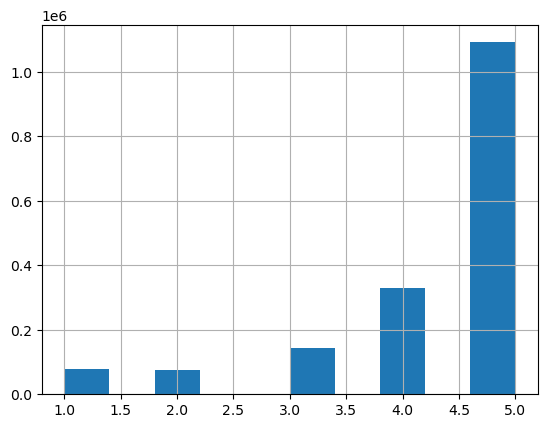

In [10]:
# Построим график распределения рейтингов.
ratings['rating'].hist()

Посмотрим сколько уникальных пользователей и товаров есть в наборе данных.

In [11]:
ratings['item'].nunique()

13381

In [12]:
ratings['user'].nunique()

1212989

### 2.2 Распределение рейтингов
Построим график распределения рейтингов с помощью библиотеки `plotly`.

In [13]:
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

data = ratings['rating'].value_counts().sort_index(ascending=False)

trace = go.Bar(x = data.index,
               text = ['{:.1f} %'.format(val) for val in (data.values / ratings.shape[0] * 100)],
               textposition = 'auto',
               textfont = dict(color = '#000000'),
               y = data.values,
               )
# Create layout
layout = dict(title = 'Распределение {} рейтингов'.format(ratings.shape[0]),
              xaxis = dict(title = 'Рейтинг'),
              yaxis = dict(title = 'Количество'))
# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [14]:
data = ratings.groupby('item')['rating'].count().clip(upper=50)

trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
layout = go.Layout(title = 'Распределение рейтингов по книгам',
                   xaxis = dict(title = 'Число рейтингов по книгам'),
                   yaxis = dict(title = 'Количество книг'),
                   bargap = 0.2)

fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

ПО с максимальным количеством рейтингов.

In [15]:
ratings.groupby('item')['rating'].count().reset_index().sort_values('rating', ascending=False)[:10]

,item,rating
1919,0007420412,44371
2301,0007548672,27944
933,000711835X,18591
1977,0007444117,18029
1868,0007378033,13088
1104,0007155662,11584
1821,0007350899,11581
208,0002247399,9911
5087,006017322X,9649
1040,0007141424,9011


### 2.4 Распределение рейтингов по пользователям

Построим график распределения рейтингов по пользователям.

In [16]:
data = ratings.groupby('user')['rating'].count().clip(upper=30)

trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0,
                                  end = 30,
                                  size = 2))
layout = go.Layout(title = 'Распределение рейтингов по пользователям',
                   xaxis = dict(title = 'Рейтинг по пользователям'),
                   yaxis = dict(title = 'Количество пользователей'),
                   bargap = 0.2)

fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

Найдем пользователей с наибольшим количеством рейтингов.

In [17]:
ratings.groupby('user')['rating'].count().reset_index().sort_values('rating', ascending=False)[:10]

,user,rating
117286,A1D2C0WDCSHUWZ,735
456183,A2F6N60Z96CAJI,632
179374,A1K1JW1C5CUSUZ,390
587057,A2TX179XAT5GRP,309
539451,A2OJW07GQRNJUT,302
296794,A1X8VZWTOG8IS6,261
466298,A2GBJQ9THOYDAJ,235
144110,A1G37DFO8MQW0M,204
188899,A1L43KWWR05PCS,203
1046779,AHD101501WCN1,201


## 3. Разбиение датасета

уберем неактивных пользователей и книги с небольшим количеством оценок. С одной стороны, такие пользователи не окажут существенного влияния на расстояния между книгами, с другой, малому количеству оценок довольно сложно доверять.

Отсортируем из датасета пользователей и товары с достаточным количеством рейтингов.

In [18]:
ratings_original = ratings.copy()
ratings_original.shape

(1718908, 4)

In [19]:
# теперь создадим фильтр 
filter_items = ratings['item'].value_counts() > 10   
filter_items = filter_items[filter_items].index.tolist()

filter_users = ratings['user'].value_counts() >  30 
filter_users = filter_users[filter_users].index.tolist()

In [20]:
# Применим фильтры и отберем книги и пользователей с достаточным количеством оценок

ratings_i = ratings['item'].isin(filter_items) # оставляем только те строки, где значение в столбце 'item' есть 
                                                        # в списке filter_items. 
ratings_u = ratings['user'].isin(filter_users) # оставляем только те строки, где значение в столбце 'users' есть 
                                                        # в списке filter_users.  
ratings_new = ratings[ratings_i & ratings_u] # Оператор & выполняет логическое "и" для результатов двух предыдущих фильтров. 
 # только строки, которые соответствуют обоим условиям будут оставлены в итоговом DataFrame.

ratings_new.shape

(49935, 4)

Отсортируем датасет по полю `timestamp`. Отложим 20% процентов для тестирования для каждого пользователя.

In [21]:
ratings = ratings_new.sort_values('timestamp')
ratings.head()

,item,user,rating,timestamp
980463,0060173858,A3AZ4O4I9S4668,4.0,869270400.0
251473,0007172915,A319KYEIAZ3SON,5.0,869702400.0
863606,0030590434,A2YUZKPLUYQDKV,5.0,871257600.0
1005749,0060186305,A2YUZKPLUYQDKV,5.0,871344000.0
174628,0007119593,A2YUZKPLUYQDKV,5.0,871430400.0


In [22]:
from tqdm.notebook import tqdm
import numpy as np

X_train_array = []
X_test_array = []
for user in tqdm(ratings['user'].unique()):
    user_ratings = ratings[ratings['user'] == user] #  Создаем DataFrame user_ratings, который содержит только записи
                                                    # из DataFrame ratings, относящиеся к текущему пользователю.
    split_index = int(user_ratings.shape[0] * 0.8) # Вычисляем индекс, по которому произойдет разделение пользователей
                                                    # на обучающий и тестовый наборы.
    X_train_array.append(user_ratings[['user', 'item', 'rating']].iloc[:split_index, :].values)
    X_test_array.append(user_ratings[['user', 'item', 'rating']].iloc[split_index:, :].values) # Добавляются пользователи,
                                                                                        # относящиеся к тестовому набору
X_train = pd.DataFrame(np.vstack(X_train_array), columns=['user', 'item', 'rating']) # Создаем DataFrame X_train путем
# объединения данных из списка X_train_array с помощью np.vstack b преобразования в DataFrame с указанием имен столбцов.
X_test = pd.DataFrame(np.vstack(X_test_array), columns=['user', 'item', 'rating'])

  0%|          | 0/884 [00:00<?, ?it/s]

In [23]:
X_train.shape, X_test.shape

((39577, 3), (10358, 3))

## 4. Построение рекомендательной системы

Построим рекомендательную систему с помощью библиотеки `surprise`
### Обучение модели

https://habr.com/ru/companies/surfingbird/articles/139518/
В item-based подходе ситуация похожая, но есть один нюанс: разные пользователи по-разному относятся к оценкам, кто-то ставит всем подряд по пять звёздочек («лайкает» все подряд сайты), а кто-то, наоборот, ставит всем по две-три звёздочки (часто жмёт «дизлайк»). Для первого пользователя низкий рейтинг («дизлайк») будет гораздо более информативен, чем высокий, а для второго – наоборот. В user-based подходе об этом автоматически заботится коэффициент корреляции. А в item-based рекомендациях, чтобы это учесть, можно, например, вычесть из каждой оценки средний рейтинг того или иного пользователя, а потом уже подсчитать корреляцию или косинус угла между векторами. Тогда в формуле для косинуса получится 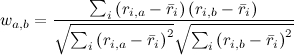,
где  обозначает средний рейтинг, выставленный пользователем i. В нашем примере, если вычесть из каждого вектора оценок среднее, получится вот что:

In [24]:
# !pip install surprise

Класс Dataset позволяет загружать и предобрабатывать данные для рекомендательной системы.
data = Dataset.load_from_file('custom_data.csv', reader=reader)

Класс Reader используется для определения того, как данные хранятся в файле. Можно настроить параметры,
такие как разделитель столбцов, минимальное и максимальное значение рейтинга и др.
reader = Reader(line_format='user item rating timestamp', sep='\t', rating_scale=(1, 5))

In [25]:
from surprise import Reader
from surprise import Dataset
from surprise import SVD
from surprise import accuracy
from surprise.model_selection import train_test_split

In [26]:
reader = Reader()
data = Dataset.load_from_df(X_train[['user', 'item', 'rating']], reader)

In [27]:
data.df.head()

,user,item,rating
0,A3AZ4O4I9S4668,0060173858,4.0
1,A3AZ4O4I9S4668,0060927860,4.0
2,A3AZ4O4I9S4668,0061009059,5.0
3,A3AZ4O4I9S4668,0006548474,1.0
4,A3AZ4O4I9S4668,0061000205,3.0


## Surprise SVD

In [28]:
# Разделение данных на обучающий и тестовый наборы
trainset, testset = train_test_split(data, test_size=0.2)

# Создание модели SVD
algo = SVD()  # (n_factors=100, n_epochs=6, lr_all=0.005, reg_all=0.02)

# Обучение модели на обучающем наборе
algo.fit(trainset)

In [29]:
# Получение прогнозов модели на тестовом наборе
predictions = algo.test(testset)

# Расчет MAE и RMSE
mae = accuracy.mae(predictions)
rmse = accuracy.rmse(predictions)

MAE:  0.6361
RMSE: 0.8421


Построение датафрейма на основе предсказанных рейтингов. 

In [30]:
predictions_df = pd.DataFrame(predictions, columns=['uid', 'iid', 'r_ui', 'est', 'details'])
predictions_df['err'] = abs(predictions_df.est - predictions_df.r_ui)
predictions_df.head()

,uid,iid,r_ui,est,details,err
0,A1POFVVXUZR3IQ,0061536083,5.0,4.548101,{'was_impossible': False},0.451899
1,A2F6N60Z96CAJI,0060938412,5.0,4.347974,{'was_impossible': False},0.652026
2,A3QZCA4LTTVGAD,0060916338,5.0,4.589570,{'was_impossible': False},0.410430
3,AIK0G28AWIL17,0007195303,3.0,3.571059,{'was_impossible': False},0.571059
4,A3KEZLJ59C1JVH,0030565073,5.0,4.700731,{'was_impossible': False},0.299269


Посмотрим на наиболее и наименее точные прогнозы

In [31]:
best_predictions = predictions_df.sort_values(by='err')[:10]
best_predictions

,uid,iid,r_ui,est,details,err
846,A32A056Q9OYP7D,0007350899,5.0,5.0,{'was_impossible': False},0.0
1720,A1MC6BFHWY6WC3,0007119313,5.0,5.0,{'was_impossible': False},0.0
7769,AIJ6XU28MF3B,0060288906,5.0,5.0,{'was_impossible': False},0.0
1724,A2WSI8HOWHFDOT,0030554179,5.0,5.0,{'was_impossible': False},0.0
4108,A1X4JO8EJ1U5BR,0007284241,5.0,5.0,{'was_impossible': False},0.0
3160,A3FVAWZNKW9GX,0060239638,5.0,5.0,{'was_impossible': False},0.0
2835,A20IIR0422G3A5,000711835X,5.0,5.0,{'was_impossible': False},0.0
2310,AFVZXHIUSXINA,0060890320,5.0,5.0,{'was_impossible': False},0.0
1734,A39529JJJEEDP5,0020088221,5.0,5.0,{'was_impossible': False},0.0
5896,A2VE83MZF98ITY,0007902107,5.0,5.0,{'was_impossible': False},0.0


In [32]:
worst_predictions = predictions_df.sort_values(by='err')[-10:]
worst_predictions

,uid,iid,r_ui,est,details,err
1082,A55MRYPUAX4QU,0061050350,1.0,4.439139,{'was_impossible': False},3.439139
3639,A2TUA4VWCMNXI,0060732075,1.0,4.449823,{'was_impossible': False},3.449823
4431,A2B21POKQ3N09H,0060976918,1.0,4.457058,{'was_impossible': False},3.457058
1760,A3JM25YVLEE318,0007436823,1.0,4.462192,{'was_impossible': False},3.462192
1612,AK7D1BHZOSOL1,0007436823,1.0,4.543950,{'was_impossible': False},3.543950
7665,A38TN3W164HE9K,0060080825,1.0,4.573519,{'was_impossible': False},3.573519
5460,A3NIQK6ZLYEP1L,0007351054,1.0,4.662543,{'was_impossible': False},3.662543
2634,A1SBFI91YMPS9I,000726755X,1.0,4.667129,{'was_impossible': False},3.667129
1289,A1OX82JPAQLL60,0060738170,1.0,4.766281,{'was_impossible': False},3.766281
3474,A2TUA4VWCMNXI,0060736690,1.0,4.776089,{'was_impossible': False},3.776089


In [33]:
predictions_df['err'].value_counts(bins=10)

(-0.0047799999999999995, 0.378]    3008
(0.378, 0.755]                     2430
(0.755, 1.133]                     1337
(1.133, 1.51]                       583
(1.51, 1.888]                       251
(1.888, 2.266]                      143
(2.266, 2.643]                       82
(2.643, 3.021]                       51
(3.021, 3.398]                       19
(3.398, 3.776]                       12
Name: err, dtype: int64

Как видно, модель показала неплохие значения. Теперь используем ее для расчета рейтингов для ранее отложенной части выборки

## 5. Оценка качества построенной рекомендательной системы

In [34]:
test_predictions_df = X_test.rename(columns={'user':'uid', 'item':'iid', 'rating':'r_ui'})
test_predictions_df.head()

,uid,iid,r_ui
0,A3AZ4O4I9S4668,0060193883,4.0
1,A3AZ4O4I9S4668,0007196962,5.0
2,A3AZ4O4I9S4668,0060527307,5.0
3,A3AZ4O4I9S4668,0060817089,5.0
4,A3AZ4O4I9S4668,0007196997,3.0


Проверим предсказание на одной строке из тестового набора.

uid - уникальный идентификатор пользователя (User ID), который указывается как аргумент uid в методе predict().
iid - уникальный идентификатор товара (Item ID), который передается в метод predict() как идентификатор товара iid.
r_ui - реальный рейтинг, предоставленный пользователем данному товару. Значение r_ui передается в метод predict() как истинное значение рейтинга.
В итоге, переменная test_prediction будет содержать прогноз модели для выбранного тестового наблюдения, основанный на пользователе, товаре и реальном рейтинге из этого наблюдения.

In [35]:
test_row = test_predictions_df.iloc[1]
test_prediction = algo.predict(uid=test_row['uid'], iid=test_row['iid'], r_ui=test_row['r_ui'])
test_prediction

Prediction(uid='A3AZ4O4I9S4668', iid='0007196962', r_ui=5.0, est=3.9257539181060155, details={'was_impossible': False})

Как видно, результат оказался вполне приемлимым.
Теперь посчитаем предсказание для всего тестового набора.

In [36]:
tqdm.pandas()

test_predictions_df['est'] = test_predictions_df.progress_apply(
    lambda row: algo.predict(uid=row[0], iid=row[1], r_ui=row[2]).est, axis=1)
test_predictions_df['err'] = abs(test_predictions_df.est - test_predictions_df.r_ui)
test_predictions_df.head()

  0%|          | 0/10358 [00:00<?, ?it/s]

,uid,iid,r_ui,est,err
0,A3AZ4O4I9S4668,0060193883,4.0,3.755690,0.24431
1,A3AZ4O4I9S4668,0007196962,5.0,3.925754,1.074246
2,A3AZ4O4I9S4668,0060527307,5.0,3.780909,1.219091
3,A3AZ4O4I9S4668,0060817089,5.0,3.961684,1.038316
4,A3AZ4O4I9S4668,0007196997,3.0,3.573874,0.573874


In [37]:
test_predictions_df['err'].value_counts(bins=10)

(-0.00486, 0.386]    3871
(0.386, 0.771]       3261
(0.771, 1.157]       1762
(1.157, 1.542]        767
(1.542, 1.928]        340
(1.928, 2.313]        162
(2.313, 2.699]         98
(2.699, 3.084]         53
(3.47, 3.855]          27
(3.084, 3.47]          17
Name: err, dtype: int64

Как видно, во многих результат ошибка предсказания не превышает одного пункта. Посчитаем `RMSE`.

In [38]:
from sklearn.metrics import mean_squared_error

rmse = np.sqrt(mean_squared_error(test_predictions_df['r_ui'], test_predictions_df['est']))
print('RMSE={:.5f}'.format(rmse))

RMSE=0.84958


Теперь мы можем получить персонализированные рекомендации для конкретного пользователя. Для этого выберем случайного пользователя и получим рекомендации.

In [41]:
from collections import defaultdict
from surprise import Dataset, SVD
import random 
def get_top_n(predictions, n=10):
    """Return the top-N recommendation for each user from a set of predictions.

    Args:
        predictions(list of Prediction objects): The list of predictions, as
            returned by the test method of an algorithm.
        n(int): The number of recommendation to output for each user. Default
            is 10.

    Returns:
    A dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.
    """
    # Сначала сопоставим прогнозы с каждым пользователем.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Затем отсортируем прогнозы для каждого пользователя и извлечем k самых высоких из них.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [42]:
# Выбираем случайного пользователя
user_id = random.choice(predictions_df['uid'].unique())

# Получаем топ N рекомендаций для пользователя
top_n = get_top_n(predictions, n=10)

print(f"Рекомендации книг для пользователя {user_id}:")
for book_id, rating in top_n[user_id]:
    print(f"Книга ID: {book_id}, Рейтинг: {rating}")

Рекомендации книг для пользователя ADYZOSTF9LZLD:
Книга ID: 0060751967, Рейтинг: 4.562805801458399
Книга ID: 0007273754, Рейтинг: 4.436117318511615
Книга ID: 0060593636, Рейтинг: 4.3624238781697775
Книга ID: 0007236115, Рейтинг: 4.304236455138672
Книга ID: 0060555831, Рейтинг: 4.30070573067929
Книга ID: 0060734574, Рейтинг: 4.275902543738125


## Surprise KNN

In [43]:
from surprise import Dataset, Reader, KNNBasic
from surprise.model_selection import train_test_split

# Разбиение данных на обучающий и тестовый наборы
trainset, testset = train_test_split(data, test_size=0.2)

# Тренировка модели KNN с заданными параметрами
sim_options = {
    'name': 'pearson_baseline',
    'user_based': False
}
algo = KNNBasic(sim_options=sim_options)
algo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [44]:
# Получение прогнозов модели на тестовом наборе
predictions = algo.test(testset)

In [45]:
predictions_df = pd.DataFrame(predictions, columns=['uid', 'iid', 'r_ui', 'est', 'details'])
predictions_df['err'] = abs(predictions_df.est - predictions_df.r_ui)
predictions_df.head()

,uid,iid,r_ui,est,details,err
0,AORT3BGJ6RK7R,0060176679,2.0,4.202899,"{'was_impossible': True, 'reason': 'User and/o...",2.202899
1,A3R8PXSFGY9MC2,0007306202,4.0,4.202899,"{'was_impossible': True, 'reason': 'User and/o...",0.202899
2,A30ZPSYOGFJXR6,0060528877,4.0,4.202899,"{'was_impossible': True, 'reason': 'Not enough...",0.202899
3,A3NL83J9TWP6OM,0030862108,5.0,4.934531,"{'actual_k': 4, 'was_impossible': False}",0.065469
4,A2F6N60Z96CAJI,0060874376,5.0,4.202899,"{'was_impossible': True, 'reason': 'Not enough...",0.797101


In [46]:
# Расчет MAE и RMSE
mae = accuracy.mae(predictions)
rmse = accuracy.rmse(predictions)

MAE:  0.6737
RMSE: 0.9418


In [47]:
# Делаем предикт
uid = str('A3AZ4O4I9S4668')
iid = str('0007196962')
actual_rating = 5
algo.predict(uid=uid, iid=iid, r_ui=actual_rating, verbose=True)

user: A3AZ4O4I9S4668 item: 0007196962 r_ui = 5.00   est = 5.00   {'actual_k': 1, 'was_impossible': False}


Prediction(uid='A3AZ4O4I9S4668', iid='0007196962', r_ui=5, est=5, details={'actual_k': 1, 'was_impossible': False})

In [48]:
kf = split.KFold(random_state=0, n_splits=5)
cross_validate(algo, data, measures=['RMSE', 'MAE'], cv=kf, verbose=True)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Evaluating RMSE, MAE of algorithm KNNBasic on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9548  0.9437  0.9311  0.9537  0.9541  0.9475  0.0092  
MAE (testset)     0.6885  0.6738  0.6646  0.6790  0.6823  0.6776  0.0081  
Fit time          1.27    1.27    1.24    1.27    1.28    1.26    0.01    
Test time         0.47    0.51    0.49    0.50    0.49  

{'test_rmse': array([0.95480329, 0.94370551, 0.93110324, 0.95370137, 0.95410178]),
 'test_mae': array([0.6885049 , 0.67384083, 0.66455257, 0.67901621, 0.68227864]),
 'fit_time': (1.2658884525299072,
  1.2672076225280762,
  1.2390527725219727,
  1.2702302932739258,
  1.2818660736083984),
 'test_time': (0.4683346748352051,
  0.508188009262085,
  0.4915049076080322,
  0.5030102729797363,
  0.4863893985748291)}

In [49]:
test_predictions_df = X_test.rename(columns={'user':'uid', 'item':'iid', 'rating':'r_ui'})
test_predictions_df.head()

,uid,iid,r_ui
0,A3AZ4O4I9S4668,0060193883,4.0
1,A3AZ4O4I9S4668,0007196962,5.0
2,A3AZ4O4I9S4668,0060527307,5.0
3,A3AZ4O4I9S4668,0060817089,5.0
4,A3AZ4O4I9S4668,0007196997,3.0


In [50]:
from surprise import KNNBasic
from collections import defaultdict
from surprise.model_selection import cross_validate
import random  # Добавляем импорт модуля random

def get_top_n(predictions, n=10):
    # Сначала сопоставим прогнозы с каждым пользователем.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Затем отсортируем прогнозы для каждого пользователя и извлечем k самых высоких из них.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [51]:
# Выбираем случайного пользователя
user_id = random.choice(predictions_df['uid'].unique())

# Получаем топ N рекомендаций для пользователя
top_n = get_top_n(predictions, n=10)

print(f"Рекомендации книг для пользователя {user_id}:")
for book_id, rating in top_n[user_id]:
    print(f"Книга ID: {book_id}, Рейтинг: {rating}")

Рекомендации книг для пользователя A2VG0RY3EUWZKB:
Книга ID: 0060083964, Рейтинг: 5
Книга ID: 0061451541, Рейтинг: 5
Книга ID: 0007151276, Рейтинг: 4.662192613634082
Книга ID: 0060740221, Рейтинг: 4.467453795975824
Книга ID: 0060513926, Рейтинг: 4.202899466220271
Книга ID: 006074216X, Рейтинг: 4.202899466220271
Книга ID: 0007171226, Рейтинг: 4.172564284541487


In [52]:
# Выбираем  пользователя 'A25ACLV5KPB4W'
user_id = 'A25ACLV5KPB4W'

# Получение списка айтемов, которые пользователь еще не оценивал
items_unseen_by_user = predictions_df.loc[~predictions_df['iid'].isin(predictions_df[predictions_df['uid'] == user_id]['iid'])]['iid'].unique()

# Создание списка предсказаний для пользователя
user_predictions = [(user_id, item_id, 0, algo.predict(user_id, item_id).est, None) for item_id in items_unseen_by_user]

# Получение топ N рекомендаций для пользователя
top_n_for_user = get_top_n(user_predictions, n=10)

# Вывод рекомендаций для пользователя 'A25ACLV5KPB4W'
print(f"Рекомендации книг для пользователя {user_id}:")
for book_id, rating in top_n_for_user[user_id]:
    print(f"Книга ID: {book_id}, Рейтинг: {rating}")


Рекомендации книг для пользователя A25ACLV5KPB4W:
Книга ID: 0007310250, Рейтинг: 5
Книга ID: 006085880X, Рейтинг: 5
Книга ID: 0061075795, Рейтинг: 5
Книга ID: 0030562945, Рейтинг: 5
Книга ID: 0007120702, Рейтинг: 5
Книга ID: 0007548672, Рейтинг: 5
Книга ID: 0060539089, Рейтинг: 5
Книга ID: 0060526556, Рейтинг: 5
Книга ID: 0060505222, Рейтинг: 5
Книга ID: 0001047868, Рейтинг: 5


In [53]:
# Выбираем  пользователя 'ADYZOSTF9LZLD'
user_id = 'ADYZOSTF9LZLD'

# Получение списка айтемов, которые пользователь еще не оценивал
items_unseen_by_user = predictions_df.loc[~predictions_df['iid'].isin(predictions_df[predictions_df['uid'] == user_id]['iid'])]['iid'].unique()

# Создание списка предсказаний для пользователя
user_predictions = [(user_id, item_id, 0, algo.predict(user_id, item_id).est, None) for item_id in items_unseen_by_user]

# Получение топ N рекомендаций для пользователя
top_n_for_user = get_top_n(user_predictions, n=10)

# Вывод рекомендаций для пользователя 'A25ACLV5KPB4W'
print(f"Рекомендации книг для пользователя {user_id}:")
for book_id, rating in top_n_for_user[user_id]:
    print(f"Книга ID: {book_id}, Рейтинг: {rating}")


Рекомендации книг для пользователя ADYZOSTF9LZLD:
Книга ID: 0060528877, Рейтинг: 5
Книга ID: 0007350783, Рейтинг: 5
Книга ID: 0060778660, Рейтинг: 5
Книга ID: 0060514949, Рейтинг: 5
Книга ID: 0061020621, Рейтинг: 5
Книга ID: 0060833211, Рейтинг: 5
Книга ID: 0061178047, Рейтинг: 5
Книга ID: 0060515139, Рейтинг: 5
Книга ID: 0007245696, Рейтинг: 5
Книга ID: 0007120702, Рейтинг: 5


## Рекомендации книг для пользователя A25ACLV5KPB4W:

**Методом SVD**\
Книга ID: 0001720295, Рейтинг: 4.840650380402165\
Книга ID: 000711138X, Рейтинг: 4.586421734318849\
Книга ID: 0007118317, Рейтинг: 4.467403231405686\
Книга ID: 0060892994, Рейтинг: 4.441479694569618\
Книга ID: 0060598395, Рейтинг: 4.321318936943468\
Книга ID: 0020449313, Рейтинг: 4.2738847009260885\
Книга ID: 000711835X, Рейтинг: 4.258877929875151\

\
**Методом KNN**
Книга ID: 000724780X, Рейтинг: 5\
Книга ID: 006065273X, Рейтинг: 5\
Книга ID: 0060083271, Рейтинг: 5\
Книга ID: 0030590434, Рейтинг: 5\
Книга ID: 0060873094, Рейтинг: 5\
Книга ID: 0060590254, Рейтинг: 5\
Книга ID: 0061355437, Рейтинг: 5\
Книга ID: 0060006935, Рейтинг: 5\
Книга ID: 0006511309, Рейтинг: 5\
Книга ID: 0006511317, Рейтинг: 5\


## Рекомендации книг для пользователя ADYZOSTF9LZLD:

**Методом SVD**\
Книга ID: 0060751967, Рейтинг: 4.562805801458399\
Книга ID: 0007273754, Рейтинг: 4.436117318511615\
Книга ID: 0060593636, Рейтинг: 4.3624238781697775\
Книга ID: 0007236115, Рейтинг: 4.304236455138672\
Книга ID: 0060555831, Рейтинг: 4.30070573067929\
Книга ID: 0060734574, Рейтинг: 4.275902543738125\

**Методом KNN**\
Книга ID: 0060528877, Рейтинг: 5\
Книга ID: 0007350783, Рейтинг: 5\
Книга ID: 0060778660, Рейтинг: 5\
Книга ID: 0060514949, Рейтинг: 5\
Книга ID: 0061020621, Рейтинг: 5\
Книга ID: 0060833211, Рейтинг: 5\
Книга ID: 0061178047, Рейтинг: 5\
Книга ID: 0060515139, Рейтинг: 5\
Книга ID: 0007245696, Рейтинг: 5\
Книга ID: 0007120702, Рейтинг: 5\

## Вывод: на примере двух пользователей совпадений в рекомендованных книгах разными методами не выявлено